
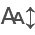

In [1]:
# Imports
import pandas as pd
import seaborn as sns

from IPython.display import display

import itables
from itables import init_notebook_mode

# Specific imports from ccf_medication modules
from ccf_medication.utils.loading import (
    load_and_format_all_results, 
)

from ccf_medication.plotting.stripplots import plot_strip_box_plot
from ccf_medication.plotting.utils import build_fixed_palette, get_sig_drug_fam_pairs

# Constants
from ccf_medication.constants.pathing import (
    REMISSION_TX_DATAFRAME_PATH,
    REMISSION_PX_DATAFRAME_PATH,
)

from ccf_medication.constants.tables import (
    NO_MEDICATION,
    DRUG_FAMILY_COL,
    FC_COL_MED_VS_NO_MED,
    PVAL_COL_MED_VS_NO_MED,
)

from ccf_medication.constants.thresholds import (
    ADJ_PVAL_THRESH,
    TX_FC_THRESH,
    PX_FC_THRESH,
)

from ccf_medication.constants.plotting import (
    MUTED_MODERN_ALL_DRUGS,
    PLOTTING_DRUG_FAMILIES_MAP
)

# Initialize notebook mode
init_notebook_mode(all_interactive=True)
itables.options.allow_html = True

# Pretty Dataframes
pd.options.mode.chained_assignment = None
sns.set(style="whitegrid")

# Load the Data Files

Loading the samples

In [2]:
# load the samples
tx_remission_samples = pd.read_parquet(REMISSION_TX_DATAFRAME_PATH)
px_remission_samples = pd.read_parquet(REMISSION_PX_DATAFRAME_PATH)


Loading the results

In [3]:
(tx_response, px_response, tx_signif_rem_vs_act, px_signif_rem_vs_act, tx_signif_med_vs_no_med, px_signif_med_vs_no_med), (tx_rem_vs_act, px_rem_vs_act, tx_med_vs_no_med, px_med_vs_no_med) = load_and_format_all_results()

# Palette

7 7


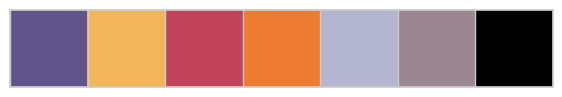

In [4]:
raw_drugs_families = tx_rem_vs_act.drug_family.unique().tolist() + px_rem_vs_act.drug_family.unique().tolist() 

unique_drug_families = list(set(raw_drugs_families))
unique_drug_families.remove(NO_MEDICATION)

# getting the unique drug families and making 'No Medication' the last item
all_unique_drug_families = sorted(unique_drug_families) + [NO_MEDICATION]

# building the palette
palette = build_fixed_palette(all_unique_drug_families, palette=MUTED_MODERN_ALL_DRUGS)

# show the palette
sns.palplot(palette.values())

# Med vs. No Med Plots for Signif Genes (for figure 4)

#### Transcriptomics

In [5]:
genes_to_plot = [('SLC6A14', 'cd', 'colon'), 
                 ('PI3', 'cd', 'small_intestine')]

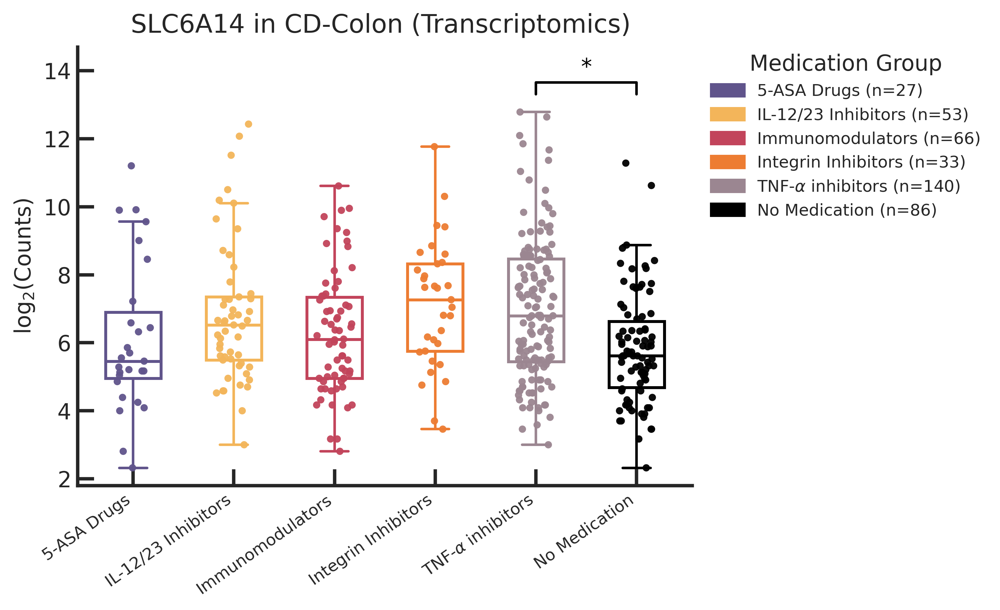

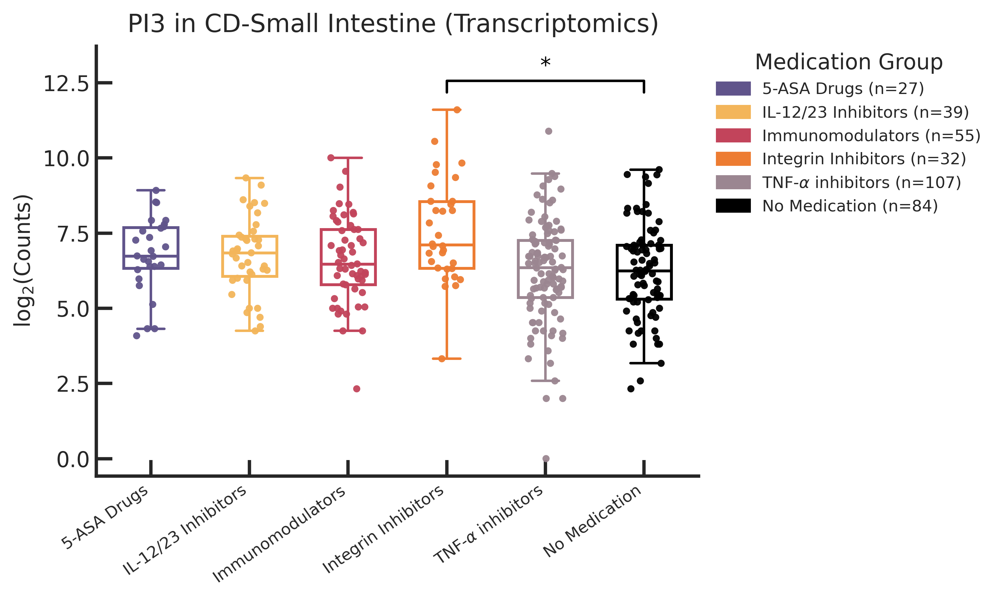

In [6]:
for gene, diagnosis, simple_tissue in genes_to_plot:
    tx_sample_subset = tx_remission_samples[(tx_remission_samples['diagnosis'] == diagnosis) & (tx_remission_samples['simple_tissue'] == simple_tissue)]

    sig_drug_families, gene_drug_families = get_sig_drug_fam_pairs(tx_med_vs_no_med, gene, {'diagnosis': diagnosis, 'simple_tissue': simple_tissue}, pval_threshold=ADJ_PVAL_THRESH, fc_threshold=TX_FC_THRESH, pval_col=PVAL_COL_MED_VS_NO_MED, fc_col=FC_COL_MED_VS_NO_MED)
    gene_samples = tx_sample_subset[tx_sample_subset[DRUG_FAMILY_COL].isin(gene_drug_families)]

    candidate_feats = [gene, gene.replace('_', '-'), gene.replace('-', '_')]
    y_col = next((c for c in candidate_feats if c in tx_sample_subset.columns), None)
    if y_col is None:
        print(f"Skipping {gene}: not found in transcriptomics samples")


    plot_strip_box_plot(
        df=gene_samples,
        x=DRUG_FAMILY_COL,
        y=gene,
        all_categories=all_unique_drug_families,
        palette_by_category=palette,
        title=f"{gene} in {diagnosis.upper()}-{simple_tissue.replace('_',' ').title()} (Transcriptomics) ",
        sig_pairs=sig_drug_families,
        sig_text="*",
        label_map=PLOTTING_DRUG_FAMILIES_MAP,
        y_label=r'$\mathrm{log}_2(\mathrm{Counts})$',
        figsize=(8, 5),
        legend_facecolor=True,
        title_fontsize=14,
        xlabel_fontsize=9,
        ylabel_fontsize=12,
        legend_title_fontsize=12,
        legend_fontsize=9,  
        x_label_rotation=35,
        x_label_ha='right'
    )

#### Proteomics

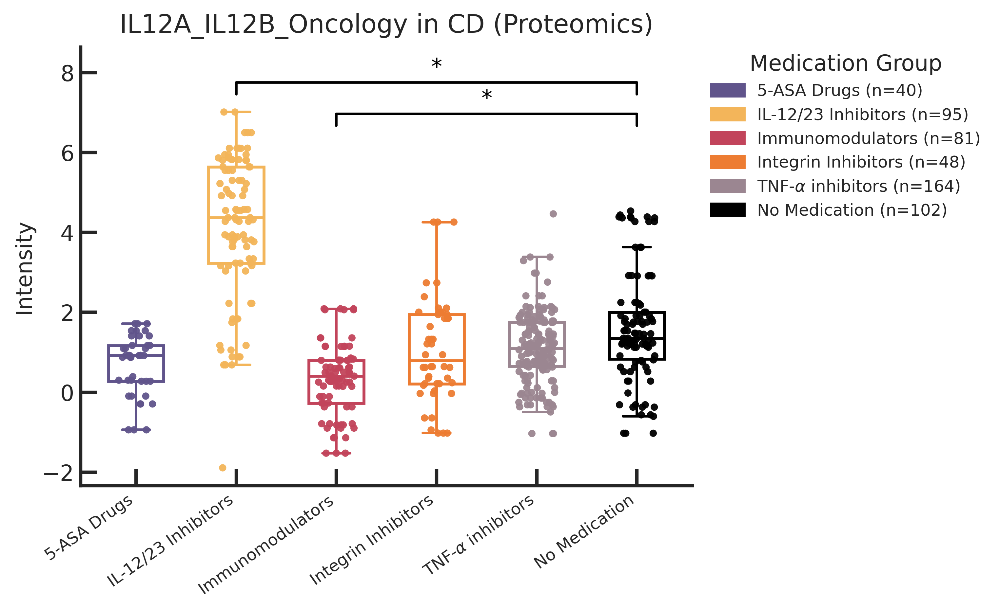

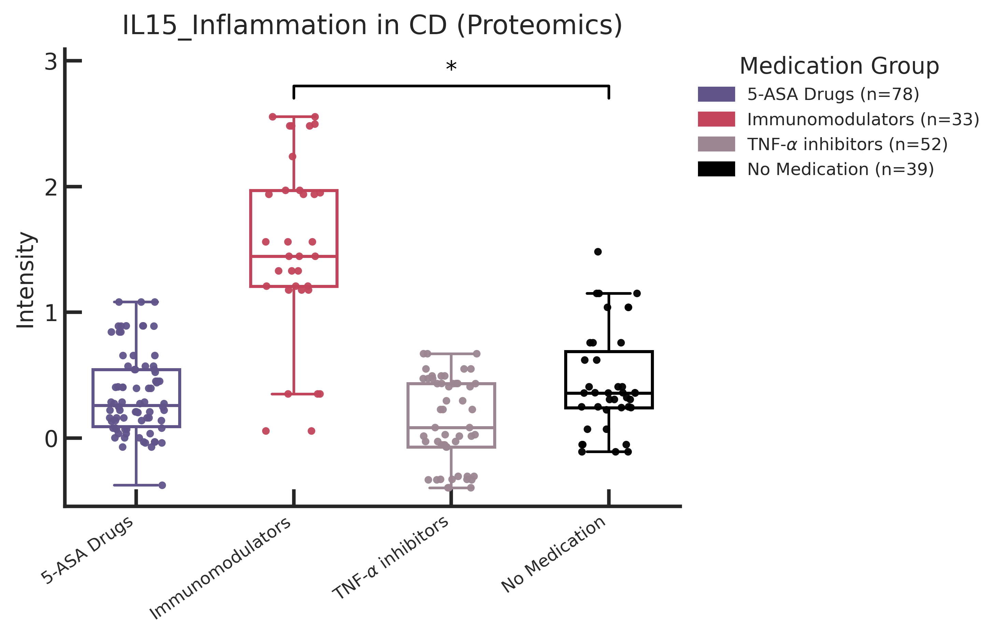

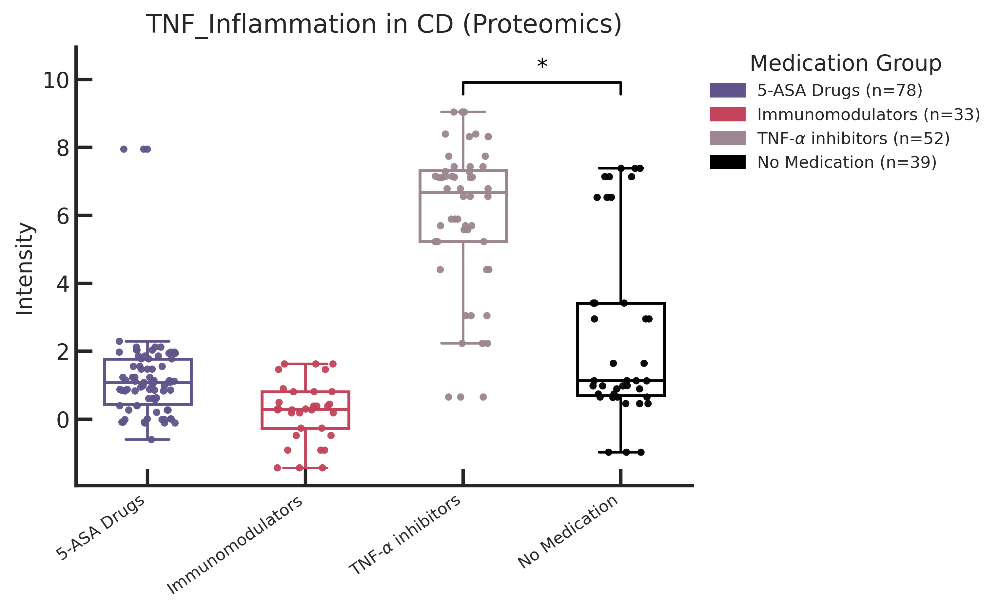

In [7]:
for gene, diagnosis in [('IL12A_IL12B_Oncology', 'cd'), ('IL15_Inflammation', 'uc'), ('TNF_Inflammation', 'uc')]:
    px_sample_subset = px_remission_samples[px_remission_samples['diagnosis'] == diagnosis]

    sig_drug_families, gene_drug_families = get_sig_drug_fam_pairs(px_med_vs_no_med, gene, {'diagnosis': diagnosis}, pval_threshold=ADJ_PVAL_THRESH, fc_threshold=PX_FC_THRESH, pval_col=PVAL_COL_MED_VS_NO_MED, fc_col=FC_COL_MED_VS_NO_MED)
    gene_samples = px_sample_subset[px_sample_subset[DRUG_FAMILY_COL].isin(gene_drug_families)]

    candidate_feats = [gene, gene.replace('_', '-'), gene.replace('-', '_')]
    y_col = next((c for c in candidate_feats if c in px_sample_subset.columns), None)
    if y_col is None:
        print(f"Skipping {gene}: not found in transcriptomics samples")


    plot_strip_box_plot(
        df=gene_samples,
        x=DRUG_FAMILY_COL,
        y=gene,
        all_categories=all_unique_drug_families,
        palette_by_category=palette,
        title=f"{gene} in CD (Proteomics)",
        sig_pairs=sig_drug_families,
        sig_text="*",
        y_label='Intensity',
        label_map=PLOTTING_DRUG_FAMILIES_MAP,
        figsize=(8, 5),
        legend_facecolor=True,
        title_fontsize=14,
        xlabel_fontsize=9,
        ylabel_fontsize=12,
        legend_title_fontsize=12,
        legend_fontsize=9,  
    )

# Med vs. No Med for Response Genes (for figure 5)

Make 'No Medication' come first in the plot

In [8]:
modified_all_unique_drug_families = all_unique_drug_families.copy()
modified_all_unique_drug_families.remove(NO_MEDICATION)
modified_all_unique_drug_families.insert(0, NO_MEDICATION)


#### Transcriptomics

/home/timothy.hart/ccf-medication/ccf_medication/plotting/stripplots.py:141: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize, dpi=dpi)


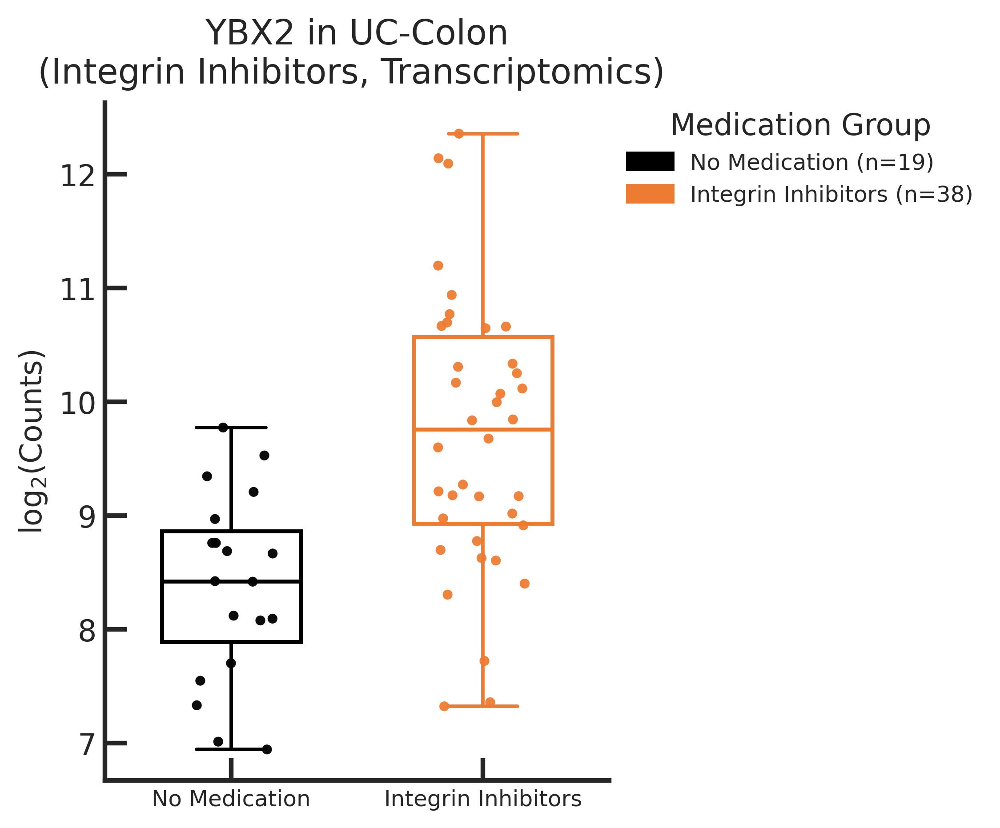

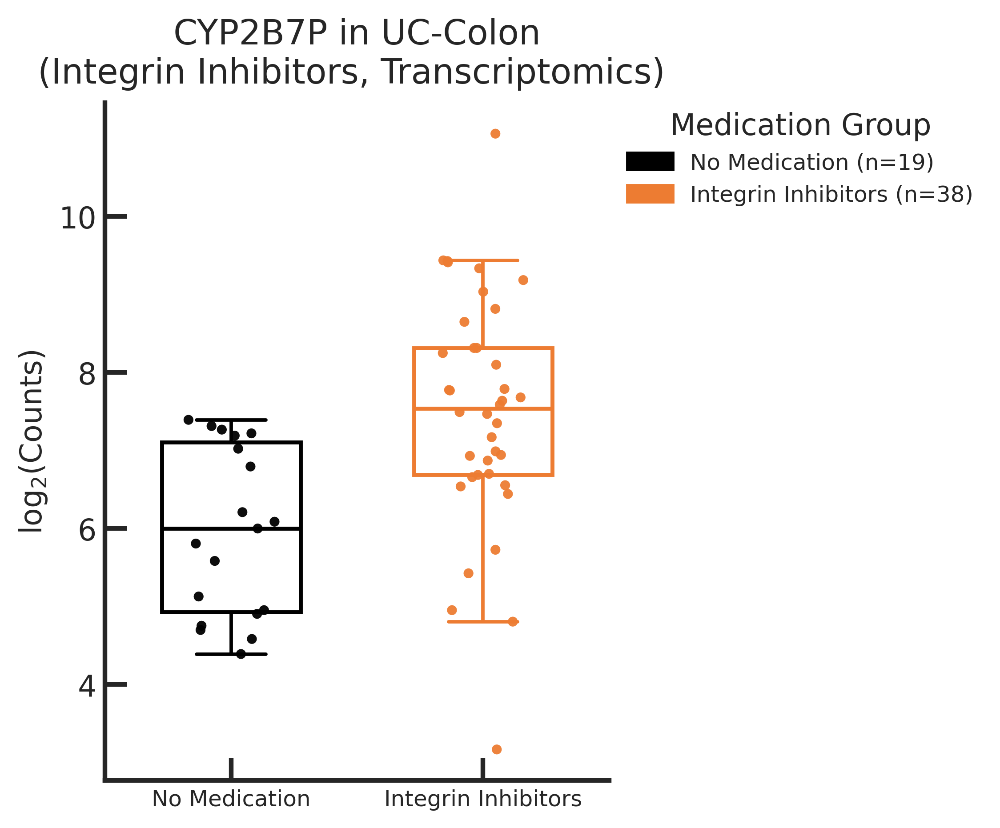

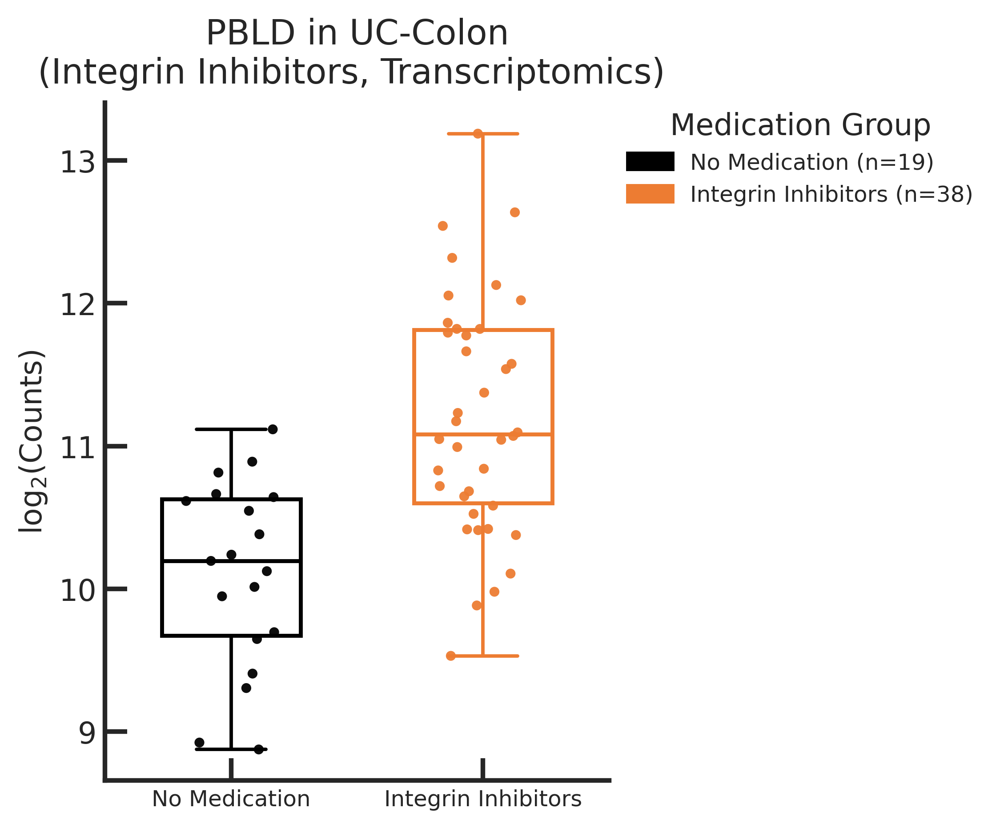

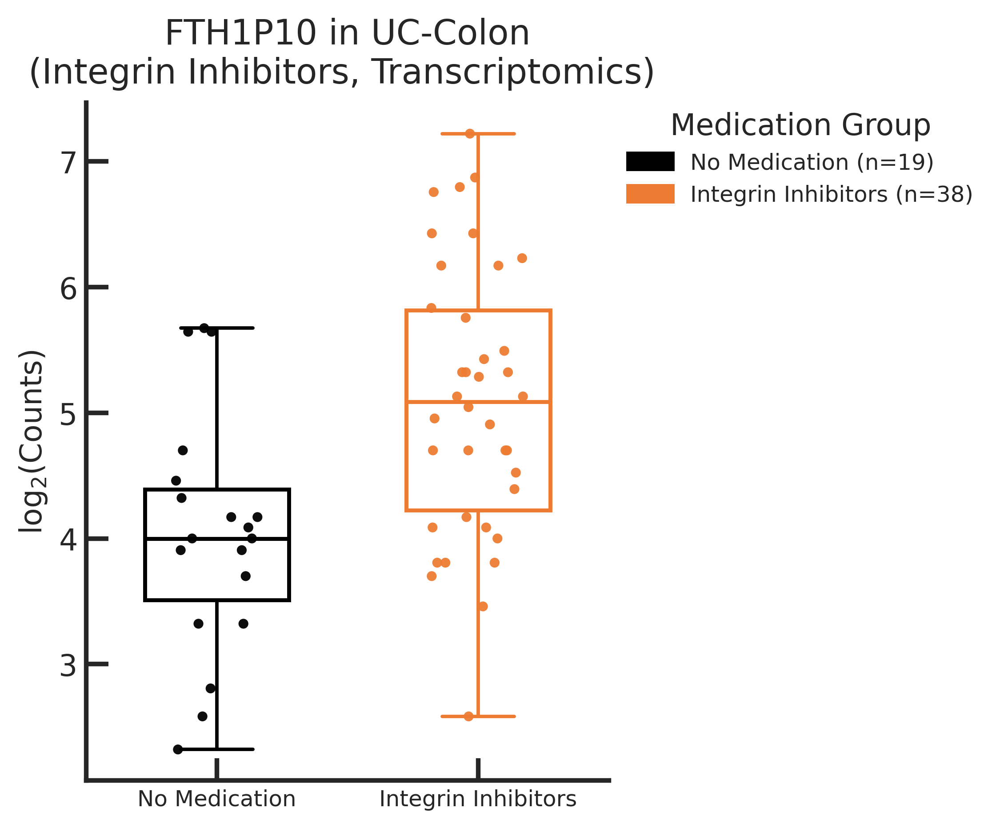

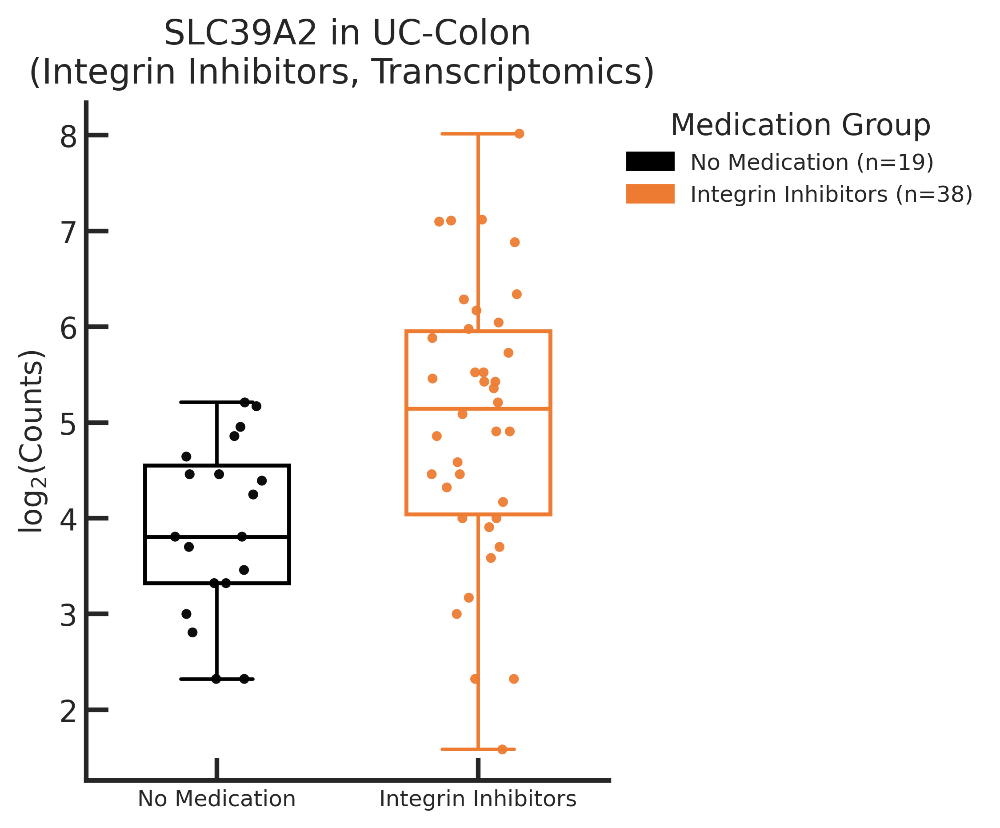

...

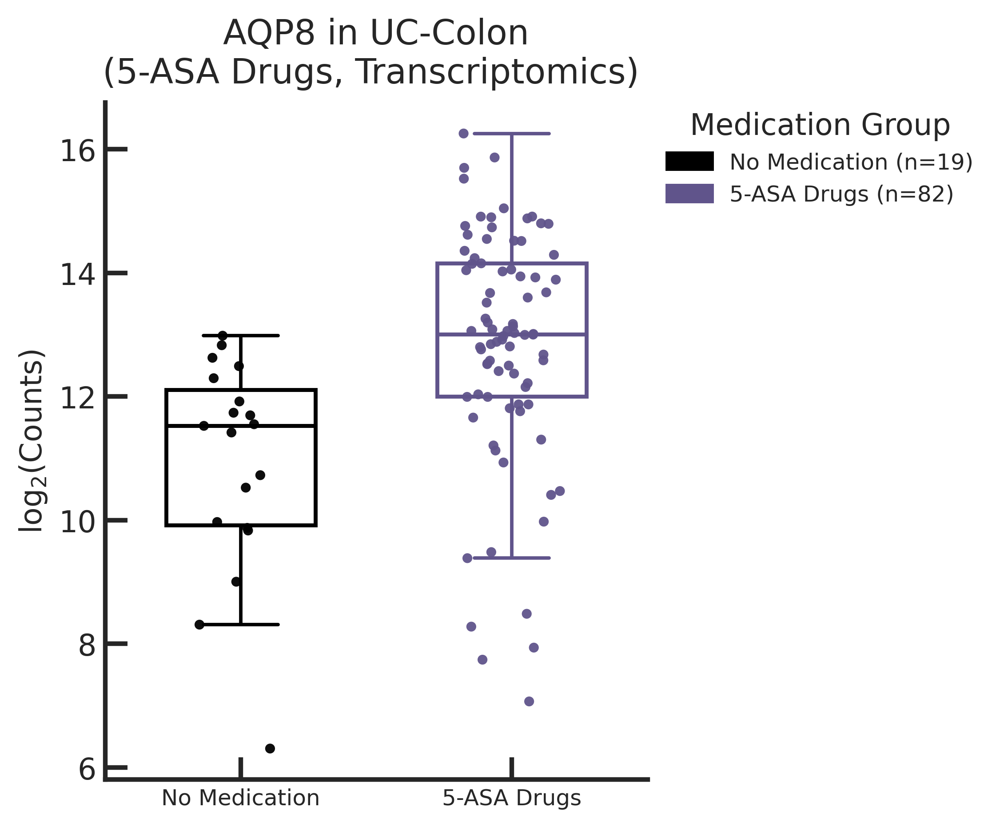

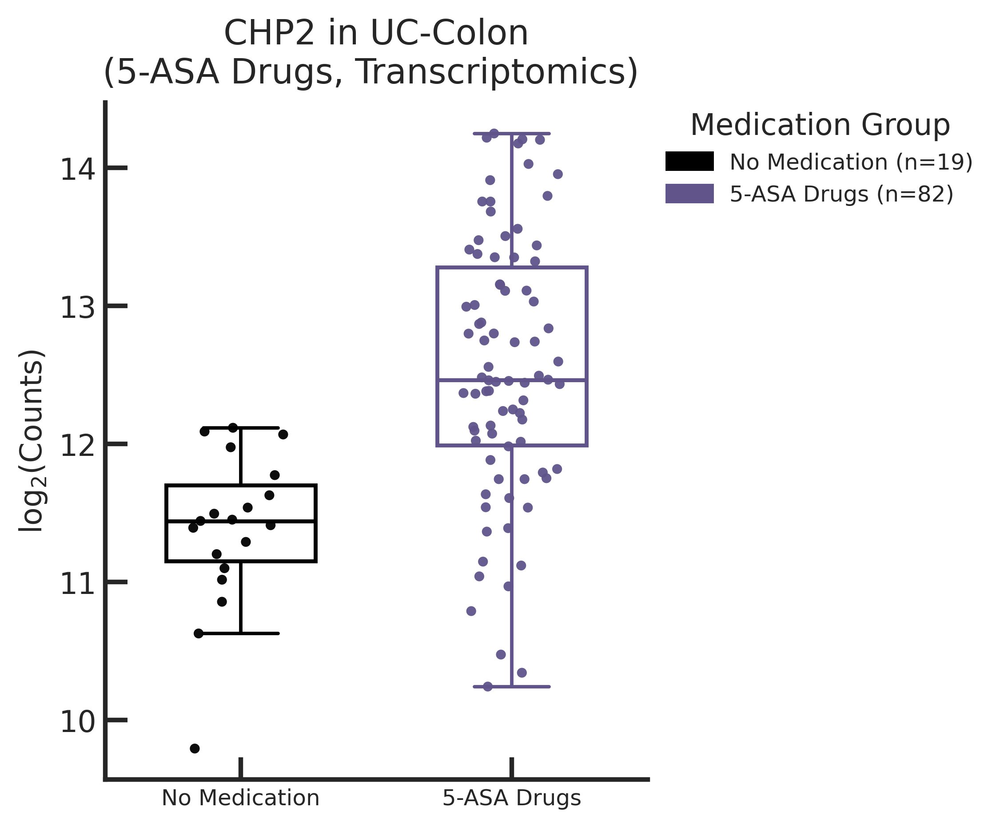

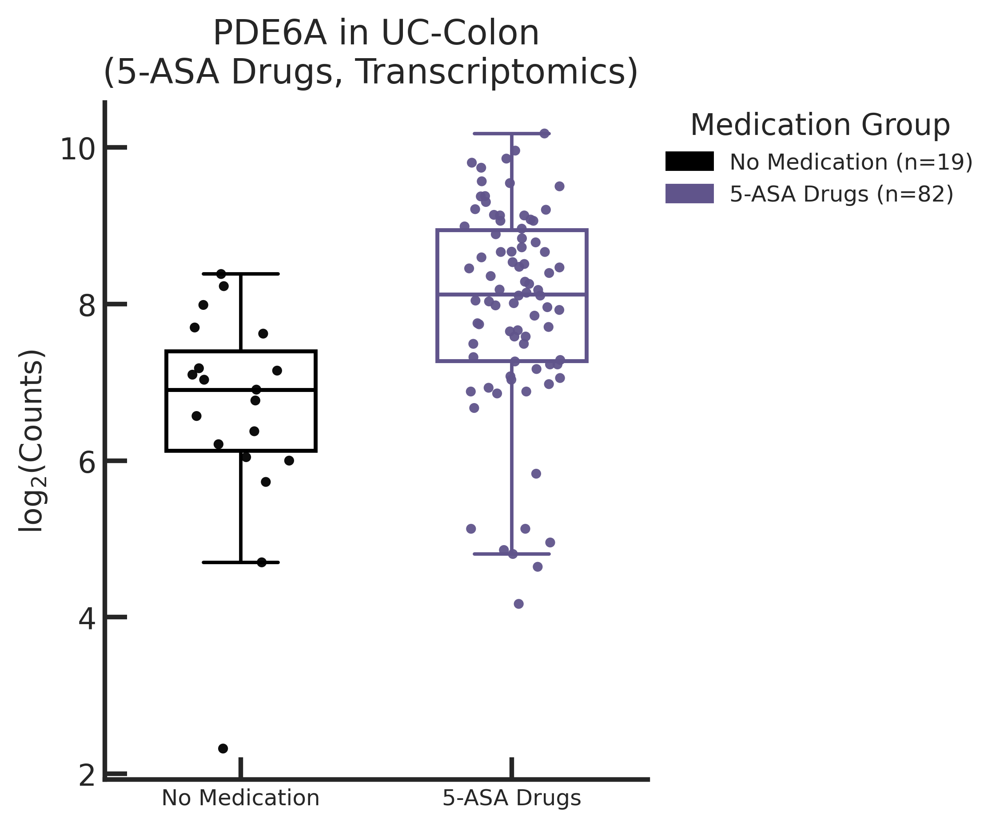

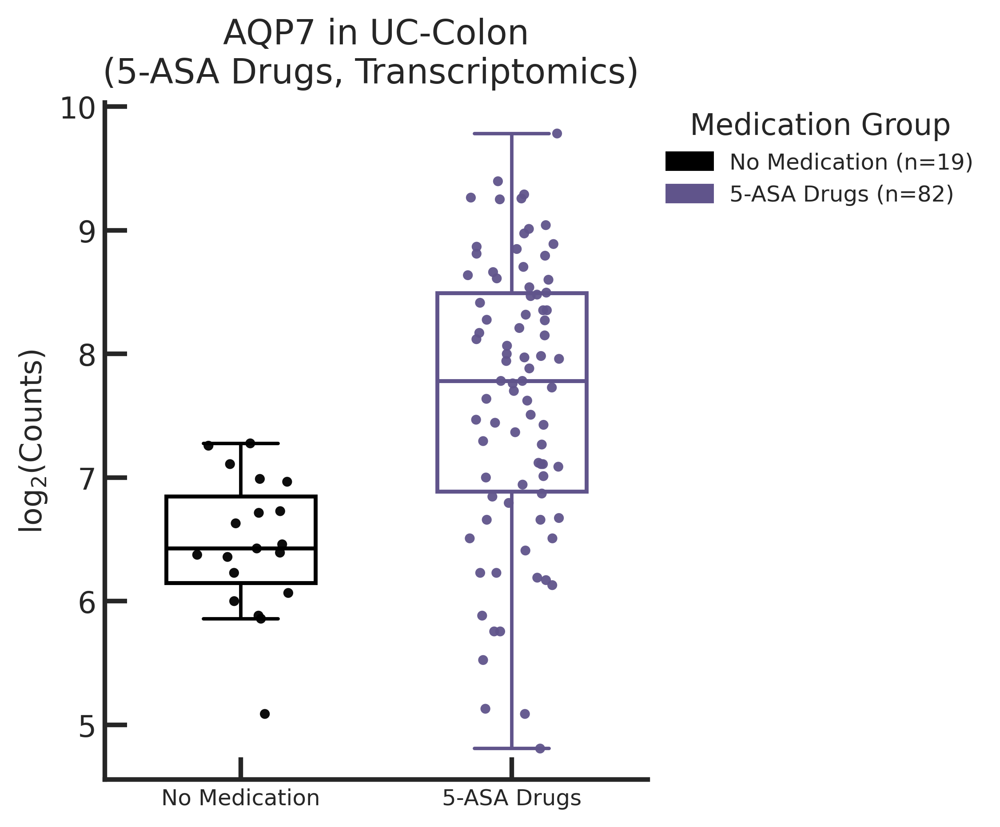

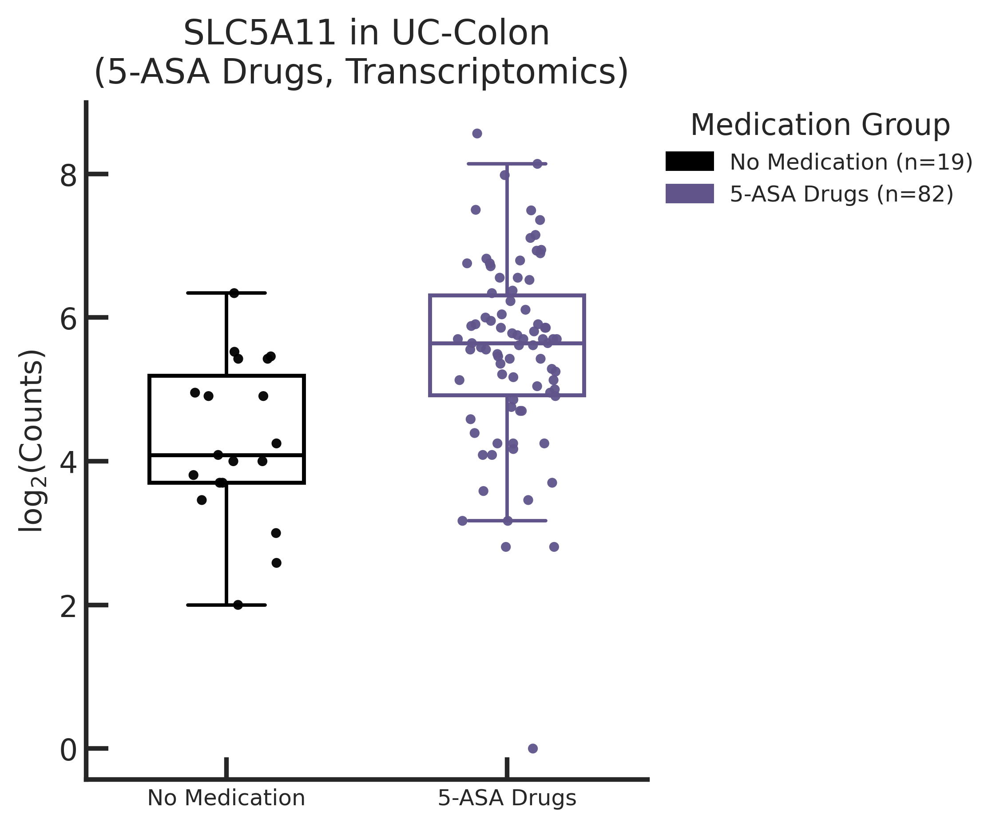

In [9]:
for index, row in tx_response[['diagnosis', 'drug_family', 'simple_tissue', 'feature']].iterrows():
    gene = row['feature']
    diagnosis = row['diagnosis']
    simple_tissue = row['simple_tissue']
    drug_family = row['drug_family']

    # load the subset samples
    tx_samples_subset = tx_remission_samples[(tx_remission_samples['diagnosis'] == diagnosis) &
                                   (tx_remission_samples['simple_tissue'] == simple_tissue) &
                                   (tx_remission_samples['drug_family'].isin([drug_family, 'No Medication']))]

    sig_drug_families, gene_drug_families = get_sig_drug_fam_pairs(tx_med_vs_no_med, gene, {'diagnosis': diagnosis, 'simple_tissue': simple_tissue}, pval_threshold=ADJ_PVAL_THRESH, fc_threshold=TX_FC_THRESH, pval_col=PVAL_COL_MED_VS_NO_MED, fc_col=FC_COL_MED_VS_NO_MED)
    gene_samples = tx_samples_subset[tx_samples_subset[DRUG_FAMILY_COL].isin(gene_drug_families)]

    # resolve gene column name in samples (handle '-' vs '_')
    candidate_feats = [gene, gene.replace('_', '-'), gene.replace('-', '_')]
    y_col = next((c for c in candidate_feats if c in tx_samples_subset.columns), None)
    if y_col is None:
        print(f"Skipping {gene}: not found in transcriptomics samples")
        continue
        
    plot_strip_box_plot(
            df=gene_samples,
            x=DRUG_FAMILY_COL,
            y=y_col,
            all_categories=modified_all_unique_drug_families,
            palette_by_category=palette,
            title=f"{gene} in {diagnosis.upper()}-{simple_tissue.replace('_',' ').title()}\n({PLOTTING_DRUG_FAMILIES_MAP[drug_family]}, Transcriptomics) ",
            sig_pairs=[],
            sig_text="*",
            label_map=PLOTTING_DRUG_FAMILIES_MAP,
            y_label=r'$\mathrm{log}_2(\mathrm{Counts})$',
            figsize=(6, 5),
            legend_facecolor=True,
            title_fontsize=14,
            xlabel_fontsize=9,
            ylabel_fontsize=12,
            legend_title_fontsize=12,
            legend_fontsize=9,  
            x_label_rotation=0,
            x_label_ha='center'
    )

#### Proteomics

['Aminosalicylates (5-ASA drugs)', 'IL-12/23 inhibitor', 'Immunomodulating antimetabolites', 'Integrin-receptor antagonists', 'TNF-alpha inhibitors', 'No Medication']


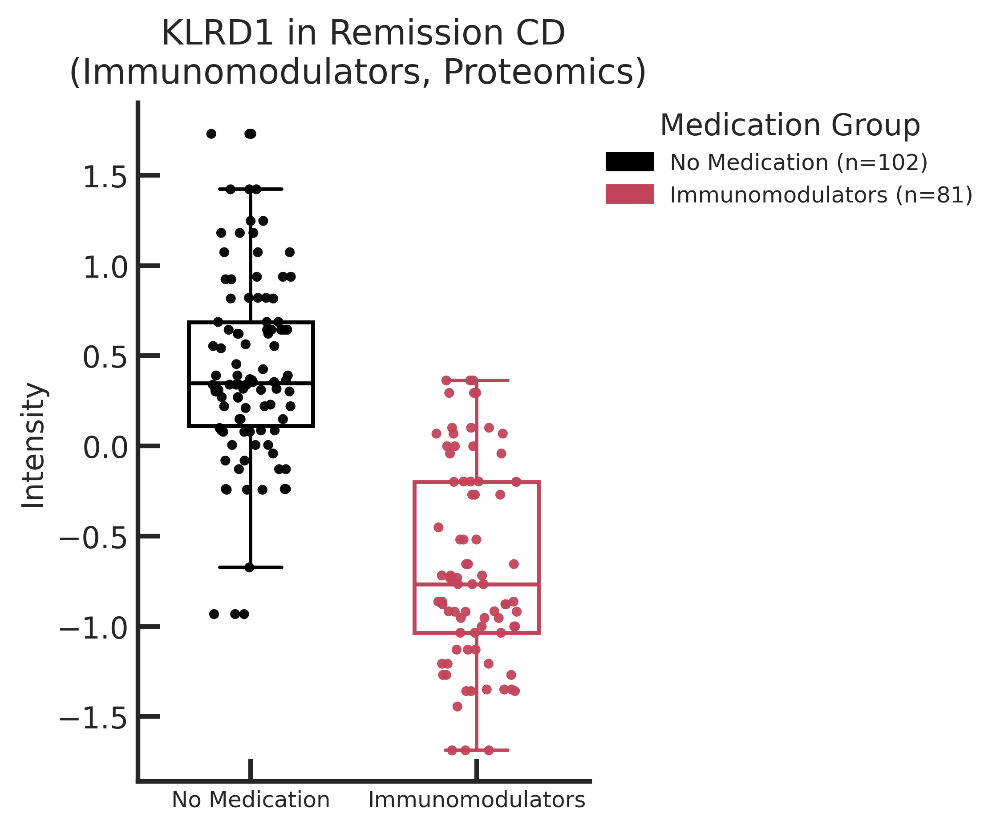

In [10]:
for index, row in px_response[['diagnosis', 'drug_family', 'feature']].iterrows():
    gene = row['feature']
    diagnosis = row['diagnosis']
    drug_family = row['drug_family']

    # load the subset samples
    px_samples_subset = px_remission_samples[(px_remission_samples['diagnosis'] == diagnosis) & (px_remission_samples['drug_family'].isin([drug_family, 'No Medication']))]

    sig_drug_families, gene_drug_families = get_sig_drug_fam_pairs(px_med_vs_no_med, gene, {'diagnosis': diagnosis}, pval_threshold=ADJ_PVAL_THRESH, fc_threshold=PX_FC_THRESH, pval_col=PVAL_COL_MED_VS_NO_MED, fc_col=FC_COL_MED_VS_NO_MED)
    gene_samples = px_samples_subset[px_samples_subset[DRUG_FAMILY_COL].isin(gene_drug_families)]

    print(gene_drug_families)

    # resolve gene column name in samples (handle '-' vs '_')
    candidate_cols = [gene, gene.replace('_', '-'), gene.replace('-', '_')]
    y_col = next((c for c in candidate_cols if c in px_samples_subset.columns), None)
    if y_col is None:
        print(f"Skipping {gene}: column not found in transcriptomics samples")
        continue
        
    plot_strip_box_plot(
            df=gene_samples,
            x=DRUG_FAMILY_COL,
            y=y_col,
            all_categories=modified_all_unique_drug_families,
            palette_by_category=palette,
            title=f"{gene.split('_')[0]} in Remission {diagnosis.upper()}\n({PLOTTING_DRUG_FAMILIES_MAP[drug_family]}, Proteomics) ",
            sig_pairs=[],
            sig_text="*",
            label_map=PLOTTING_DRUG_FAMILIES_MAP,
            y_label='Intensity',
            figsize=(6, 5),
            legend_facecolor=True,
            title_fontsize=14,
            xlabel_fontsize=9,
            ylabel_fontsize=12,
            legend_title_fontsize=12,
            legend_fontsize=9,  
            x_label_rotation=0,
            x_label_ha='center'
    )